In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"ymohsenzadeh","key":"ec974bfdcfe13d39410e17438dc1d36c"}'}

In [ ]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
import kagglehub

path = kagglehub.dataset_download("mojtabafarahani/asphalt-segmentation-dataset")

print("Path to dataset files:", path)

100%|██████████| 2.88G/2.88G [01:19<00:00, 38.9MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mojtabafarahani/asphalt-segmentation-dataset/versions/1


In [ ]:
!pip install pycocotools
!pip install opencv-python

In [ ]:
import os
import cv2
import numpy as np
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from pycocotools.coco import COCO
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader


In [ ]:
!ls -R /root/.cache/kagglehub/datasets/mojtabafarahani/asphalt-segmentation-dataset/versions/1

/root/.cache/kagglehub/datasets/mojtabafarahani/asphalt-segmentation-dataset/versions/1:
README.dataset.txt  README.roboflow.txt  test  train  valid

/root/.cache/kagglehub/datasets/mojtabafarahani/asphalt-segmentation-dataset/versions/1/test:
11_jpg.rf.c3d2d08ac2e0b4ea092f10ec532810bd.jpg
1-3-_jpg.rf.18db3719fd9b900ac8d364ffc8a9e124.jpg
1-4-_jpg.rf.78a34d7a312fe9c5b0ae06c127839752.jpg
14_jpg.rf.d9d2bc1c3cb17ed2b0c543c20be55a91.jpg
16_jpg.rf.67b9e10c2e7ec56d2c45acf77d0d272a.jpg
1-7-_jpg.rf.610e807363a88f7a04ab75ad4fe7d696.jpg
18_jpg.rf.2c4ec670f817336c71db47ab7c2cb3ea.jpg
1_jpg.rf.1dbf4f0a6ef805aeeea4af6aa2a0e8ce.jpg
20_jpg.rf.912cf9859700bbb46127fa468a74a670.jpg
21_jpg.rf.f3086f9405739e959d30711ea8922cb6.jpg
26_jpg.rf.8cf391405f59645cc184a81e5a7ebbf8.jpg
27_jpg.rf.a71c58ddc706f2fccc14dfae11a44437.jpg
40_jpg.rf.08453af28511256320c44fcb32990a87.jpg
50_jpg.rf.13ff05da4d211b86f962c53566013056.jpg
5_jpg.rf.0ae19bbf48b4725f7ec61a3d46eeba9c.jpg
_annotations.coco.json
-_-_jpg.rf.05ed0d1c0f920

**2.3. Dataset Preparation for Training**



In [ ]:
items = []

for split in ["train", "valid", "test"]:
    img_dir = os.path.join(path, split)
    ann_file = os.path.join(img_dir, "_annotations.coco.json")
    coco = COCO(ann_file)
    for img_id in coco.imgs:
        info = coco.loadImgs(img_id)[0]
        items.append((img_dir, info['file_name'], ann_file, img_id))


loading annotations into memory...
Done (t=0.11s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
import random
from pycocotools.coco import COCO
from sklearn.model_selection import train_test_split

cracked = []
undamaged = []

for item in items:
    img_dir, file_name, ann_file, img_id = item
    coco = COCO(ann_file)
    ann_ids = coco.getAnnIds(imgIds=img_id)
    if len(ann_ids) > 0:
        cracked.append(item)
    else:
        undamaged.append(item)

all_items = cracked + undamaged
labels = [1] * len(cracked) + [0] * len(undamaged)

random_seed = 42

train_items, temp_items, train_labels, temp_labels = train_test_split(
    all_items, labels, test_size=0.3, stratify=labels, random_state=random_seed
)

val_items, test_items, val_labels, test_labels = train_test_split(
    temp_items, temp_labels, test_size=0.5, stratify=temp_labels, random_state=random_seed
)

random.shuffle(train_items)
random.shuffle(val_items)
random.shuffle(test_items)

print("Training set:", train_labels.count(1), "cracked,", train_labels.count(0), "undamaged")
print("Validation set:", val_labels.count(1), "cracked,", val_labels.count(0), "undamaged")
print("Test set:", test_labels.count(1), "cracked,", test_labels.count(0), "undamaged")


Streaming output truncated to the last 5000 lines.
index created!
loading annotations into memory...
Done (t=0.10s)
creating index...
index created!
loading annotations into memory...
Done (t=0.09s)
creating index...
index created!
loading annotations into memory...
Done (t=0.10s)
creating index...
index created!
loading annotations into memory...
Done (t=0.09s)
creating index...
index created!
loading annotations into memory...
Done (t=0.09s)
creating index...
index created!
loading annotations into memory...
Done (t=0.10s)
creating index...
index created!
loading annotations into memory...
Done (t=0.10s)
creating index...
index created!
loading annotations into memory...
Done (t=0.10s)
creating index...
index created!
loading annotations into memory...
Done (t=0.10s)
creating index...
index created!
loading annotations into memory...
Done (t=0.11s)
creating index...
index created!
loading annotations into memory...
Done (t=0.10s)
creating index...
index created!
loading annotations i

**2.2.  Data Preprocessing**

In [ ]:
import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset
from pycocotools.coco import COCO

In [ ]:
class CrackDataset(Dataset):
    def __init__(self, items, img_size=(512, 512), mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)):
        self.items = items
        self.img_size = img_size
        self.mean = mean
        self.std = std
        self.coco_cache = {}

        for _, _, ann_file, _ in items:
            if ann_file not in self.coco_cache:
                self.coco_cache[ann_file] = COCO(ann_file)

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        img_dir, file_name, ann_file, img_id = self.items[idx]
        coco = self.coco_cache[ann_file]

        img_path = os.path.join(img_dir, file_name)
        image = cv2.imread(img_path)
        if image is None:
            raise FileNotFoundError(f"Image not found: {img_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        h, w = self.img_size
        image = cv2.resize(image, (w, h), interpolation=cv2.INTER_LINEAR)
        image = image.astype(np.float32) / 255.0

        # image = (image - self.mean) / self.std
        image = np.transpose(image, (2, 0, 1))

        ann_ids = coco.getAnnIds(imgIds=img_id)
        anns = coco.loadAnns(ann_ids)

        mask = np.zeros((coco.imgs[img_id]['height'], coco.imgs[img_id]['width']), dtype=np.uint8)
        for ann in anns:
            mask = np.maximum(mask, (coco.annToMask(ann) > 0).astype(np.uint8))

        mask = cv2.resize(mask, (w, h), interpolation=cv2.INTER_NEAREST)
        mask = np.expand_dims(mask, axis=0).astype(np.float32)

        return torch.from_numpy(image), torch.from_numpy(mask)


In [ ]:
train_dataset = CrackDataset(train_items)
val_dataset = CrackDataset(val_items)
test_dataset = CrackDataset(test_items)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)


loading annotations into memory...
Done (t=0.10s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.12s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.09s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
print("Dataset sizes:")
print(f"Train: {len(train_dataset)} images")
print(f"Validation: {len(val_dataset)} images")
print(f"Test: {len(test_dataset)} images")

Dataset sizes:
Train: 1479 images
Validation: 317 images
Test: 317 images


**2.4. Final Checks**

In [ ]:
for images, masks in train_loader:
    print(images.shape)
    print(masks.shape)
    break
for images, masks in val_loader:
    print(images.shape)
    print(masks.shape)
    break
for images, masks in test_loader:
    print(images.shape)
    print(masks.shape)
    break

torch.Size([4, 3, 512, 512])
torch.Size([4, 1, 512, 512])
torch.Size([4, 3, 512, 512])
torch.Size([4, 1, 512, 512])
torch.Size([4, 3, 512, 512])
torch.Size([4, 1, 512, 512])


2.3

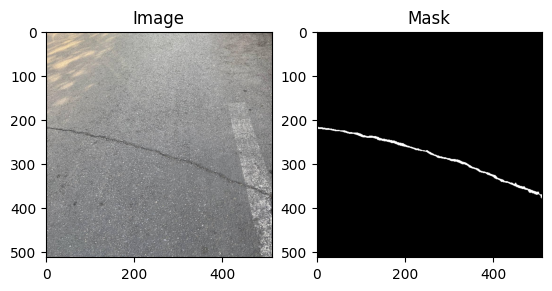

In [ ]:
img, mask = train_dataset[5]

import matplotlib.pyplot as plt
import numpy as np

plt.subplot(1,2,1)
plt.imshow(np.transpose(img.numpy(), (1,2,0)))
plt.title("Image")

plt.subplot(1,2,2)
plt.imshow(mask.numpy().squeeze(), cmap="gray")
plt.title("Mask")
plt.show()


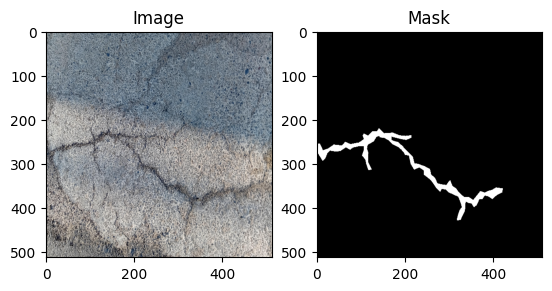

In [ ]:
img, mask = train_dataset[100]

import matplotlib.pyplot as plt
import numpy as np

plt.subplot(1,2,1)
plt.imshow(np.transpose(img.numpy(), (1,2,0)))
plt.title("Image")

plt.subplot(1,2,2)
plt.imshow(mask.numpy().squeeze(), cmap="gray")
plt.title("Mask")
plt.show()


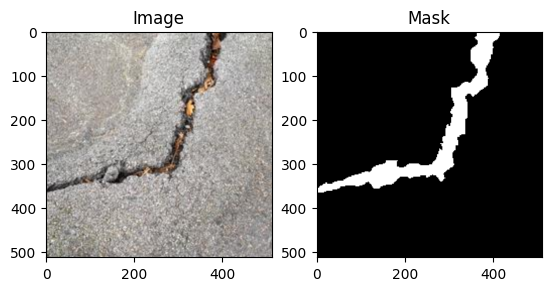

In [ ]:
img, mask = test_dataset[1]

import matplotlib.pyplot as plt
import numpy as np

plt.subplot(1,2,1)
plt.imshow(np.transpose(img.numpy(), (1,2,0)))
plt.title("Image")

plt.subplot(1,2,2)
plt.imshow(mask.numpy().squeeze(), cmap="gray")
plt.title("Mask")
plt.show()


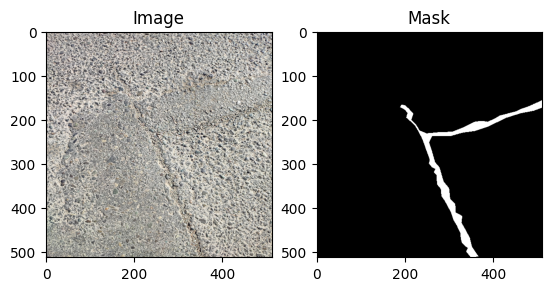

In [ ]:
img, mask = val_dataset[1]

import matplotlib.pyplot as plt
import numpy as np

plt.subplot(1,2,1)
plt.imshow(np.transpose(img.numpy(), (1,2,0)))
plt.title("Image")

plt.subplot(1,2,2)
plt.imshow(mask.numpy().squeeze(), cmap="gray")
plt.title("Mask")
plt.show()


In [ ]:
class Model(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(Model, self).__init__()

        self.enc1 = nn.Sequential(
            nn.Conv2d(in_channels, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )
        self.pool3 = nn.MaxPool2d(2)

        self.bottleneck = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

        self.up3 = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.dec3 = nn.Sequential(
            nn.Conv2d(256+128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

        self.up2 = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.dec2 = nn.Sequential(
            nn.Conv2d(128+64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

        self.up1 = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.dec1 = nn.Sequential(
            nn.Conv2d(64+32, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

        self.final_conv = nn.Conv2d(32, out_channels, kernel_size=1)

    def forward(self, x):
        e1 = self.enc1(x)
        p1 = self.pool1(e1)

        e2 = self.enc2(p1)
        p2 = self.pool2(e2)

        e3 = self.enc3(p2)
        p3 = self.pool3(e3)

        b = self.bottleneck(p3)

        d3 = self.up3(b)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)

        d2 = self.up2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)

        d1 = self.up1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        out = self.final_conv(d1)
        return out


if __name__ == "__main__":
    model = Model()
    x = torch.randn(1, 3, 512, 512)
    y = model(x)
    print("Input:", x.shape)
    print("Output:", y.shape)


Input: torch.Size([1, 3, 512, 512])
Output: torch.Size([1, 1, 512, 512])


Using device: cuda

Epoch 1/30
  Batch [10/370] Loss: 1.5895
  Batch [20/370] Loss: 1.4832
  Batch [30/370] Loss: 1.1003
  Batch [40/370] Loss: 1.1361
  Batch [50/370] Loss: 1.1429
  Batch [60/370] Loss: 1.1167
  Batch [70/370] Loss: 1.2223
  Batch [80/370] Loss: 1.1440
  Batch [90/370] Loss: 1.0685
  Batch [100/370] Loss: 1.0635
  Batch [110/370] Loss: 1.1502
  Batch [120/370] Loss: 1.1428
  Batch [130/370] Loss: 1.1307
  Batch [140/370] Loss: 1.1367
  Batch [150/370] Loss: 1.1146
  Batch [160/370] Loss: 1.1728
  Batch [170/370] Loss: 1.1245
  Batch [180/370] Loss: 1.0938
  Batch [190/370] Loss: 1.0698
  Batch [200/370] Loss: 1.0770
  Batch [210/370] Loss: 1.1068
  Batch [220/370] Loss: 1.1246
  Batch [230/370] Loss: 1.1360
  Batch [240/370] Loss: 1.0630
  Batch [250/370] Loss: 1.1561
  Batch [260/370] Loss: 1.0996
  Batch [270/370] Loss: 1.1239
  Batch [280/370] Loss: 2.0639
  Batch [290/370] Loss: 1.1182
  Batch [300/370] Loss: 1.1185
  Batch [310/370] Loss: 1.1894
  Batch [320/370]

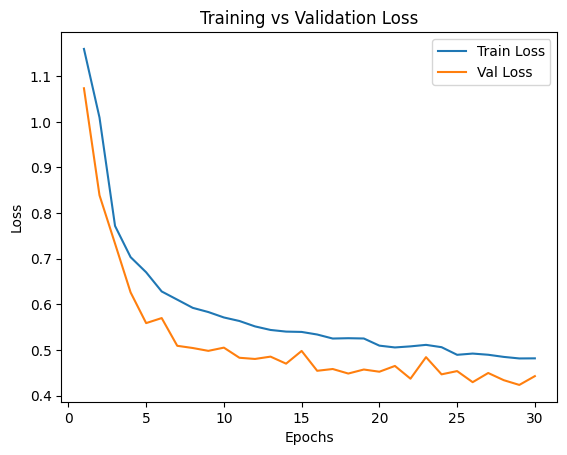

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
model = Model().to(device)

bce_loss = nn.BCEWithLogitsLoss()

def dice_loss(pred, target, smooth=1.0):
    pred = torch.sigmoid(pred)
    pred = pred.view(-1)
    target = target.view(-1)
    intersection = (pred * target).sum()
    return 1 - ((2. * intersection + smooth) / (pred.sum() + target.sum() + smooth))

def bce_dice_loss(pred, target):
    return bce_loss(pred, target) + dice_loss(pred, target)

optimizer = optim.Adam(model.parameters(), lr=1e-4)

num_epochs = 30
train_losses, val_losses = [], []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    print(f"\nEpoch {epoch+1}/{num_epochs}")

    for batch_idx, (imgs, masks) in enumerate(train_loader, 1):
        imgs, masks = imgs.to(device), masks.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = bce_dice_loss(outputs, masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        if batch_idx % 10 == 0 or batch_idx == len(train_loader):
            print(f"  Batch [{batch_idx}/{len(train_loader)}] "
                  f"Loss: {loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader)
    train_losses.append(epoch_train_loss)

    model.eval()
    val_running_loss = 0.0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            outputs = model(imgs)
            loss = bce_dice_loss(outputs, masks)
            val_running_loss += loss.item()

    epoch_val_loss = val_running_loss / len(val_loader)
    val_losses.append(epoch_val_loss)

    print(f"Epoch [{epoch+1}/{num_epochs}] "
          f"Train Loss: {epoch_train_loss:.4f} | "
          f"Val Loss: {epoch_val_loss:.4f}")

plt.plot(range(1, num_epochs+1), train_losses, label="Train Loss")
plt.plot(range(1, num_epochs+1), val_losses, label="Val Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.title("Training vs Validation Loss")
plt.show()


In [ ]:
torch.save(model.state_dict(), "model_state_dict.pth")


In [ ]:
from google.colab import files
files.download('model_state_dict.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import torch
import numpy as np
from sklearn.metrics import precision_score, recall_score
import matplotlib.pyplot as plt

Average IoU: 0.5359
Average Dice: 0.6484
Average Precision: 0.5566
Average Recall: 0.5329


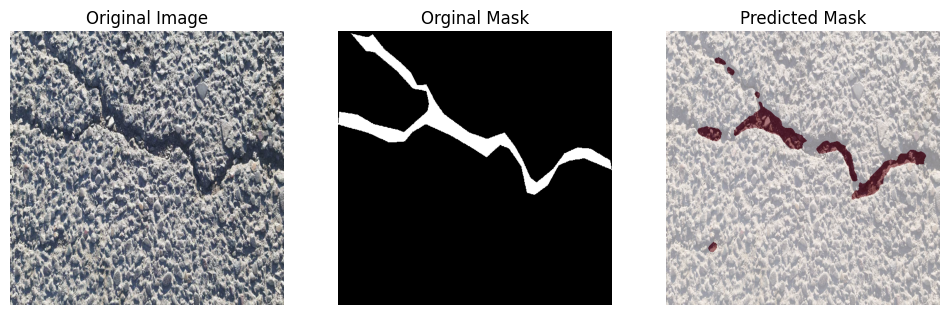

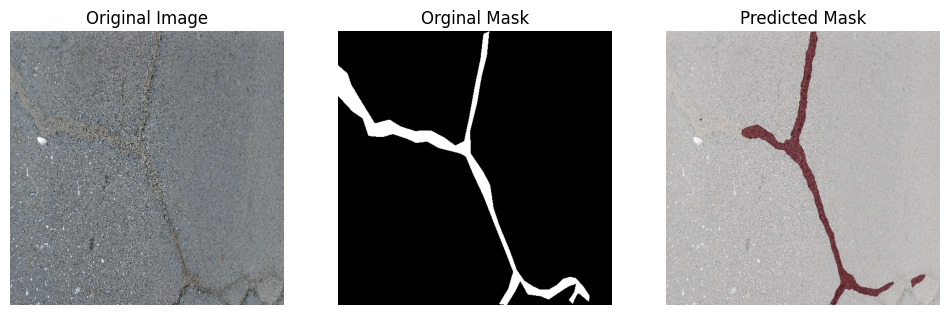

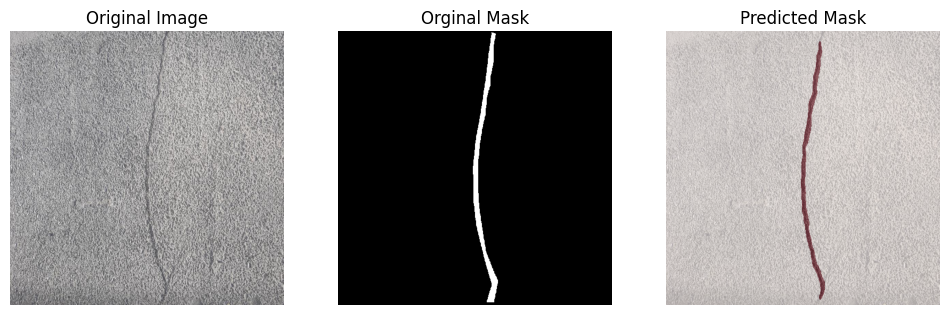

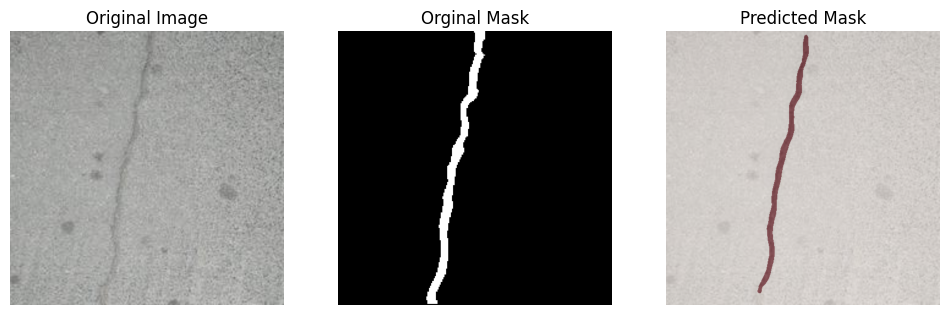

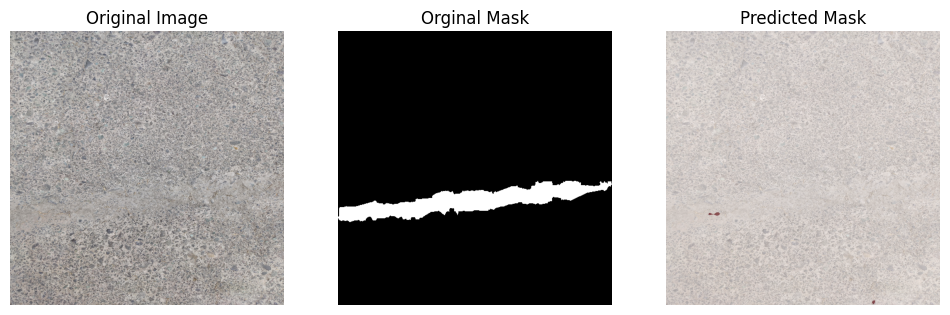

...

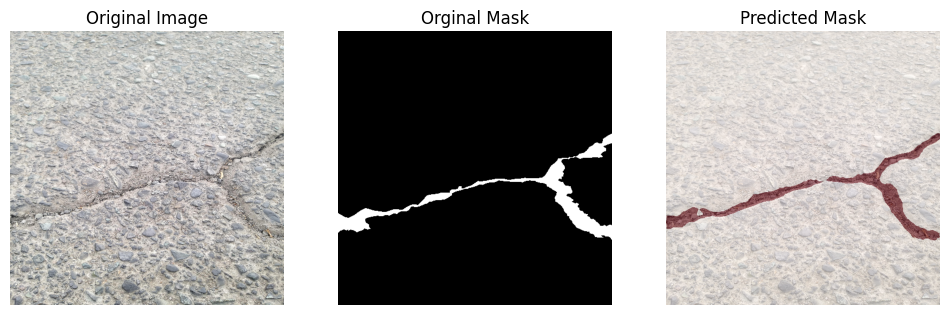

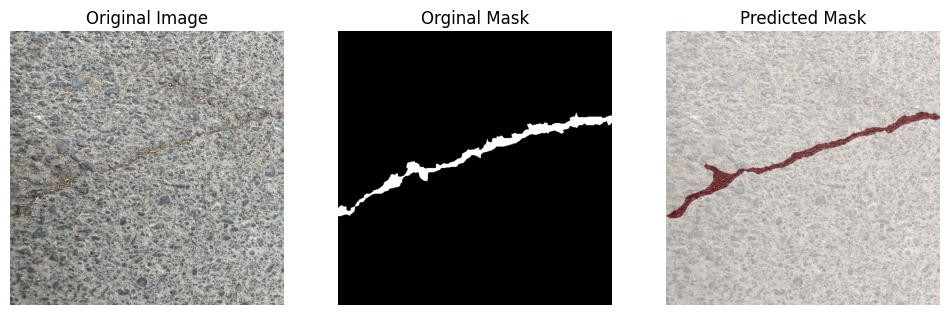

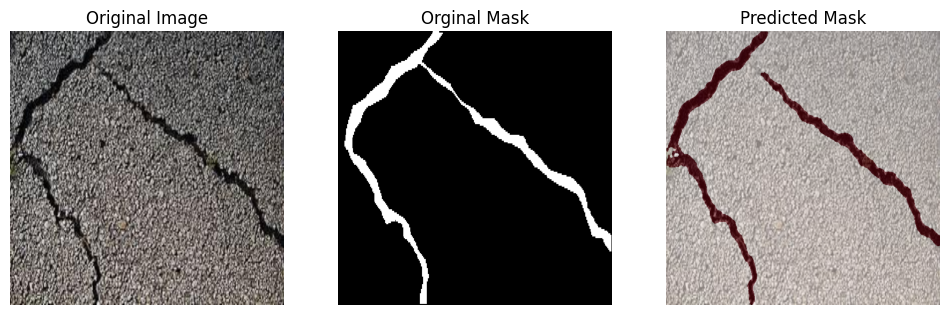

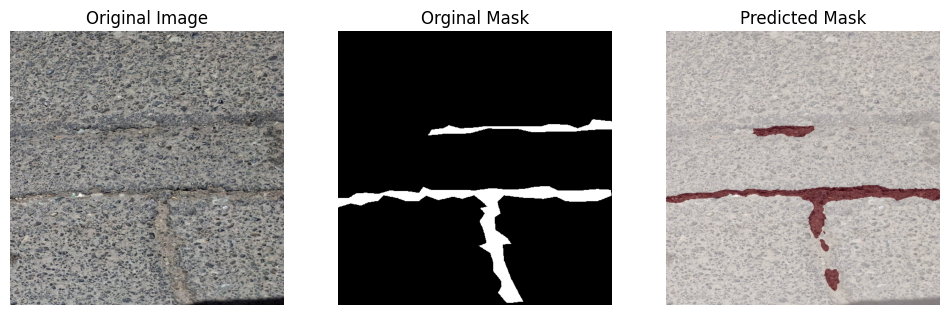

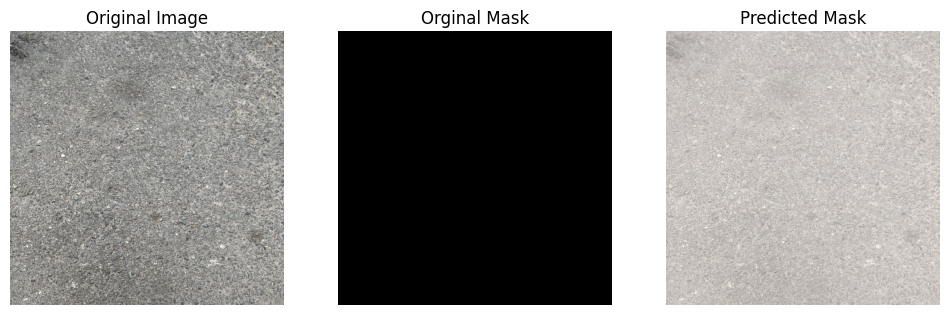

In [ ]:
def compute_metrics(pred_mask, true_mask, threshold=0.5, smooth=1e-6):
    pred_mask = torch.sigmoid(pred_mask)
    pred_bin = (pred_mask > threshold).float()
    true_mask = true_mask.float()

    intersection = (pred_bin * true_mask).sum()
    union = pred_bin.sum() + true_mask.sum() - intersection

    iou = (intersection + smooth) / (union + smooth)
    dice = (2 * intersection + smooth) / (pred_bin.sum() + true_mask.sum() + smooth)
    pred_flat = pred_bin.view(-1).cpu().numpy()
    true_flat = true_mask.view(-1).cpu().numpy()

    precision = precision_score(true_flat, pred_flat, zero_division=0)
    recall = recall_score(true_flat, pred_flat, zero_division=0)

    return iou.item(), dice.item(), precision, recall

ious, dices, precisions, recalls = [], [], [], []

model.eval()
with torch.no_grad():
    for imgs, masks in test_loader:
        imgs = imgs.to(device)
        masks = masks.to(device)
        outputs = model(imgs)
        for pred, true in zip(outputs, masks):
            iou, dice, precision, recall = compute_metrics(pred, true)
            ious.append(iou)
            dices.append(dice)
            precisions.append(precision)
            recalls.append(recall)


print(f"Average IoU: {np.mean(ious):.4f}")
print(f"Average Dice: {np.mean(dices):.4f}")
print(f"Average Precision: {np.mean(precisions):.4f}")
print(f"Average Recall: {np.mean(recalls):.4f}")

def visualize_results(img, true_mask, pred_mask, threshold=0.5):
    img = img.cpu().numpy().transpose(1,2,0)
    true_mask = true_mask.cpu().numpy()
    if true_mask.ndim == 3:
        true_mask = true_mask[0]
    pred_mask = torch.sigmoid(pred_mask).cpu().numpy()
    if pred_mask.ndim == 3:
        pred_mask = pred_mask[0]
    pred_mask_bin = (pred_mask > threshold).astype(np.uint8)

    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.title("Original Image")
    plt.imshow(img)
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.title("Orginal Mask")
    plt.imshow(true_mask, cmap='gray')
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.title("Predicted Mask")
    plt.imshow(img)
    plt.imshow(pred_mask_bin, alpha=0.5, cmap='Reds')
    plt.axis('off')
    plt.show()

with torch.no_grad():
    for i, (img, mask) in enumerate(test_loader):
        if i >= 5:
            break
        output = model(img.to(device))
        for j in range(img.size(0)):
            visualize_results(img[j], mask[j], output[j])
